# Clustering 3k PBMCs following a Seurat Tutorial

This started out (May 2017) with a demonstration that Scanpy would allow to reproduce most of Seurat's ([Satija *et al.*, 2015](https://doi.org/10.1038/nbt.3192)) clustering tutorial ([link](http://satijalab.org/seurat/pbmc3k_tutorial.html)), which we gratefully acknowledge. In the meanwhile, we have added and removed several pieces.
 
The data consists in *3k PBMCs from a Healthy Donor* and is freely available from 10x Genomics ([here](http://cf.10xgenomics.com/samples/cell-exp/1.1.0/pbmc3k/pbmc3k_filtered_gene_bc_matrices.tar.gz) from this [webpage](https://support.10xgenomics.com/single-cell-gene-expression/datasets/1.1.0/pbmc3k)).

In [2]:
import numpy as np
import pandas as pd
import scanpy.api as sc

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
results_file = './write/pbmc3k.h5ad'

scanpy==1.4 anndata==0.6.18 numpy==1.15.4 scipy==1.2.1 pandas==0.24.1 scikit-learn==0.20.2 statsmodels==0.9.0 python-igraph==0.7.1 louvain==0.6.1 


In [89]:
sc.settings.set_figure_params(dpi=150)

In [90]:
adata = sc.read_10x_mtx(
    '../data/PM1005-2D/outs/filtered_gene_bc_matrices/hg19/', var_names='gene_symbols', cache=True)

... reading from cache file ./cache/data-PM1005-2D-outs-filtered_gene_bc_matrices-hg19-matrix.h5ad


In [91]:
#adata.var_names_make_unique()

## Preprocessing

**Note:** In notebooks and jupyter lab, you can see the documentation for a python function by hitting ``SHIFT + TAB``. Hit it twice to expand the view.

Show those genes that yield the highest fraction of counts in each single cells, across all cells.

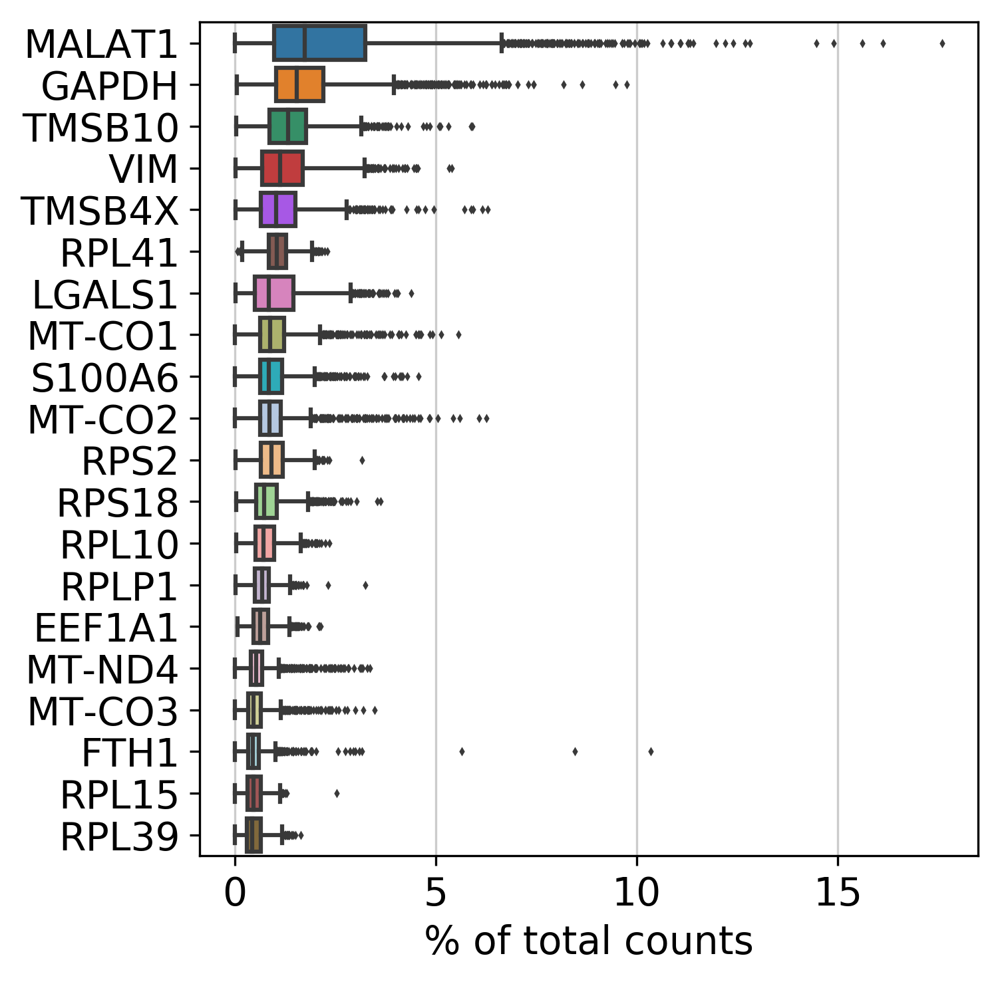

In [92]:
sc.pl.highest_expr_genes(adata, n_top=20)

Basic filtering.

In [93]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 14085 genes that are detected in less than 3 cells


Plot some information about mitochondrial genes, important for quality control. Note that you can also retrieve mitochondrial genes using `sc.queries.mitochondrial_genes_biomart('www.ensembl.org', 'mmusculus')`.

Citing from "Simple Single Cell" workflows [(Lun, McCarthy & Marioni, 2017)](https://master.bioconductor.org/packages/release/workflows/html/simpleSingleCell.html#examining-gene-level-metrics):
> High proportions are indicative of poor-quality cells (Islam et al. 2014; Ilicic et al. 2016), possibly because of loss of cytoplasmic RNA from perforated cells. The reasoning is that mitochondria are larger than individual transcript molecules and less likely to escape through tears in the cell membrane.

Note you can also use the function `pp.calculate_qc_metrics` to computes this and more.

In [94]:
mito_genes = adata.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

A violin plot of the computed quality measures.

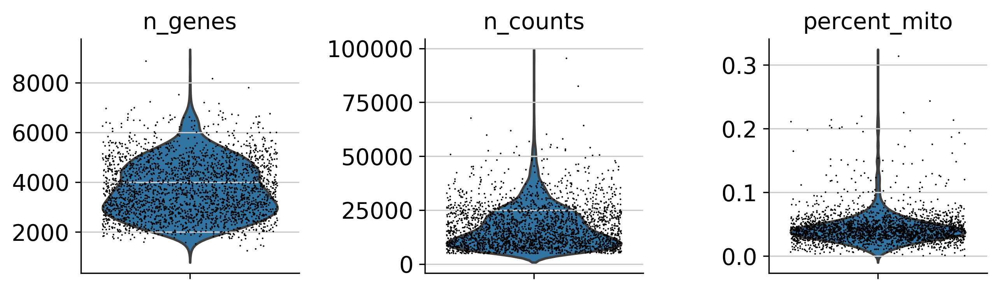

In [95]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

Remove cells that have too many mitochondrial genes expressed or too many total counts.

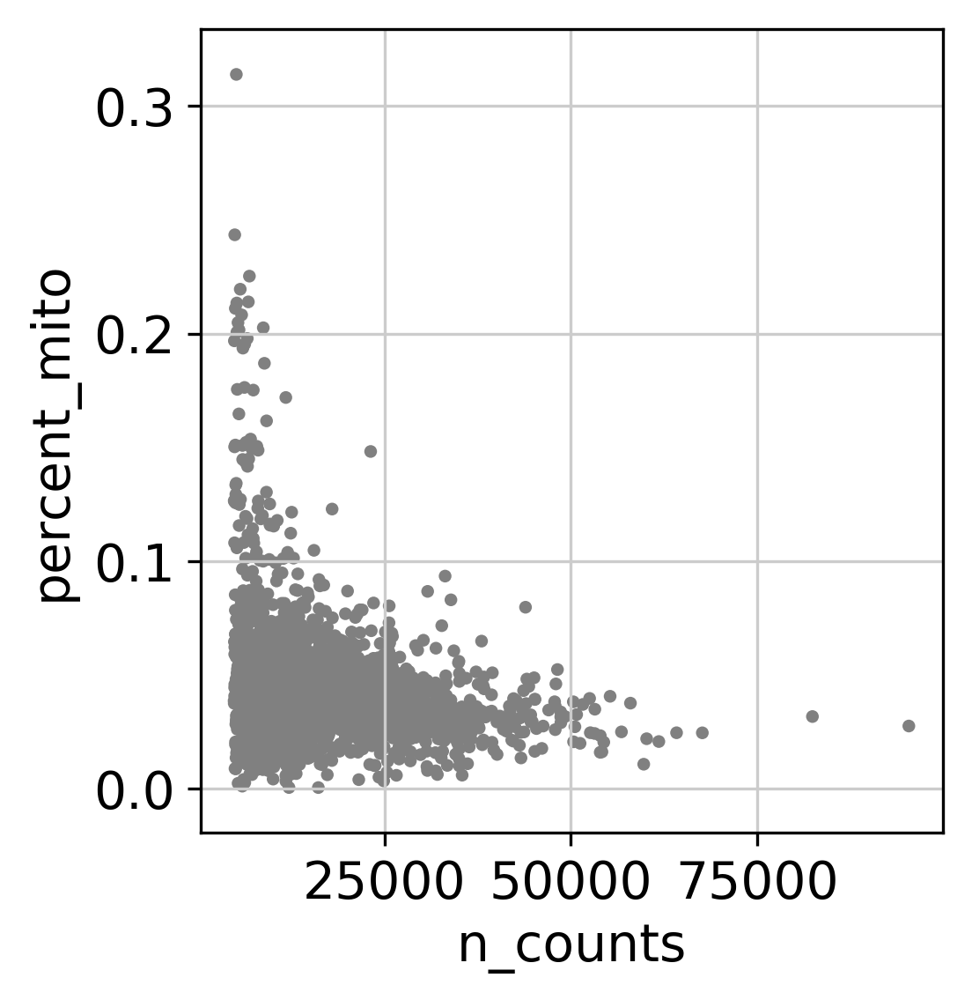

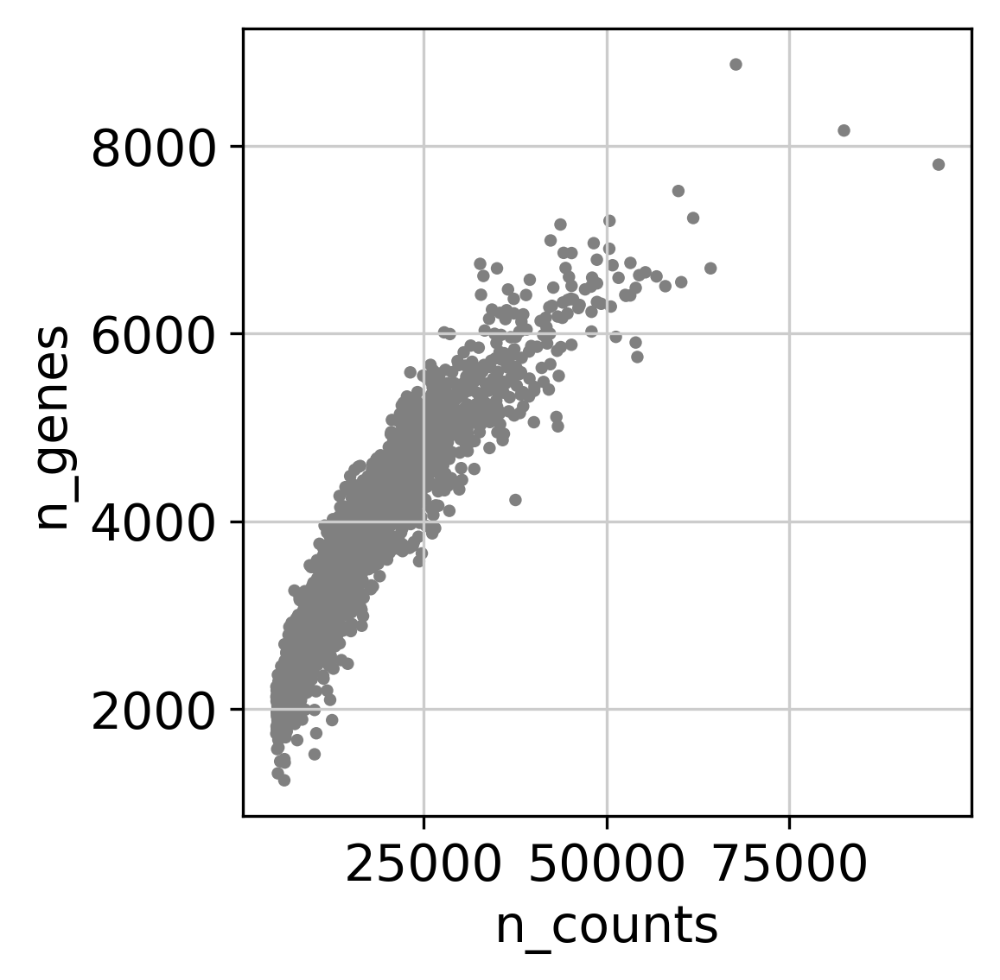

In [96]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

In [97]:
adata

AnnData object with n_obs × n_vars = 2495 × 18653 
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'n_cells'

Actually do the filtering.

In [98]:
adata = adata[adata.obs['n_genes'] > 1500, :]
adata = adata[adata.obs['percent_mito'] < 0.10, :]

In [99]:
adata

View of AnnData object with n_obs × n_vars = 2413 × 18653 
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'n_cells'

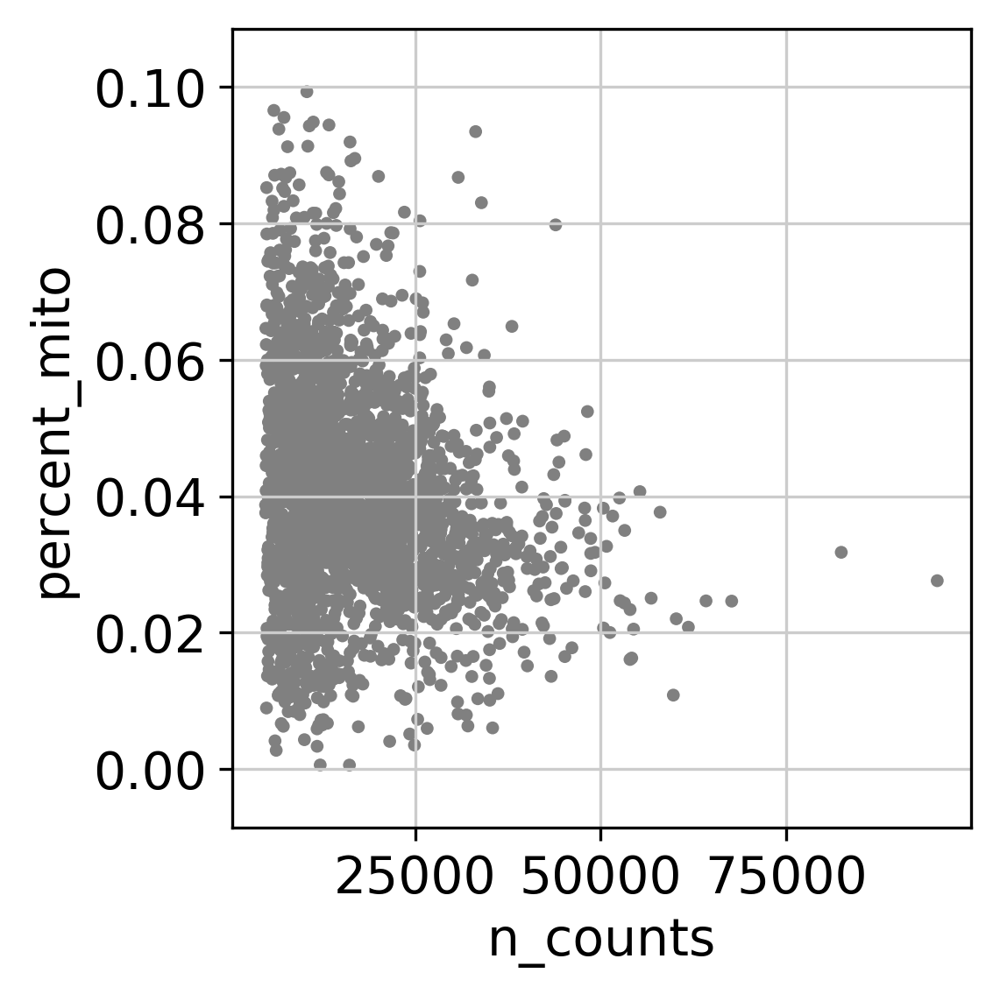

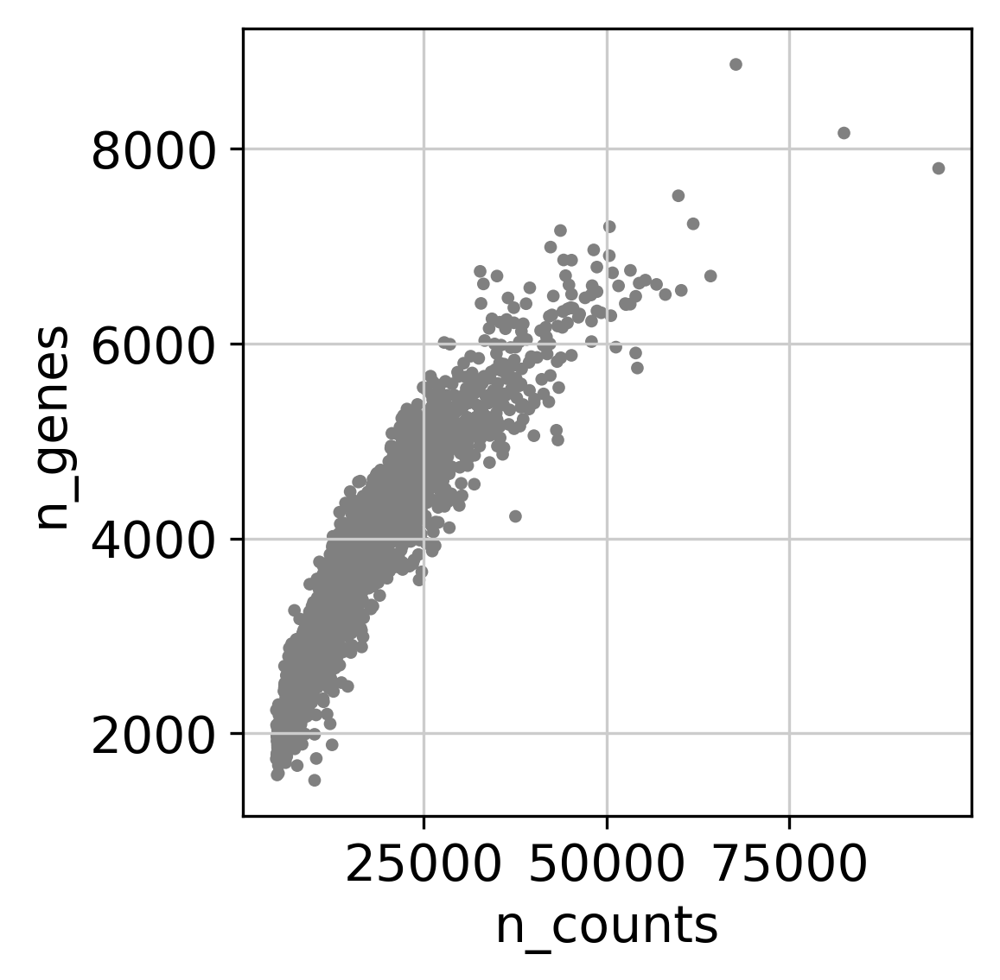

In [100]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

Logarithmize the data.

Per-cell normalize (library-size correct) the data matrix $\mathbf{X}$, so that counts become comparable among cells.

In [101]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

Logarithmize the data

In [102]:
sc.pp.log1p(adata)

Set the `.raw` attribute of AnnData object to the logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object. While many people consider the normalized data matrix as the "relevant data" for visualization and differential testing, some would prefer to store the unnormalized data.

In [103]:
adata.raw = adata

Identify highly-variable genes.

In [104]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


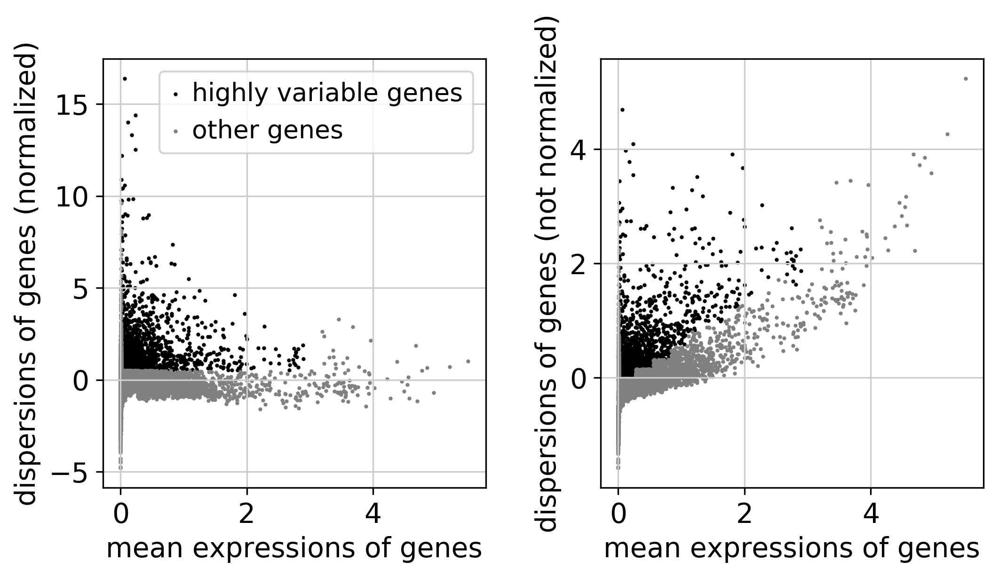

In [105]:
sc.pl.highly_variable_genes(adata)

Actually do the filtering.

In [106]:
adata = adata[:, adata.var['highly_variable']]

Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [107]:
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:08.35)


Scale each gene to unit variance. Clip values exceeding standard deviation 10.

In [108]:
sc.pp.scale(adata, max_value=10)

Save the result.

In [109]:
adata.write(results_file)

## PCA

Compute PCA and make a scatter plot.

In [110]:
sc.tl.pca(adata, svd_solver='arpack')

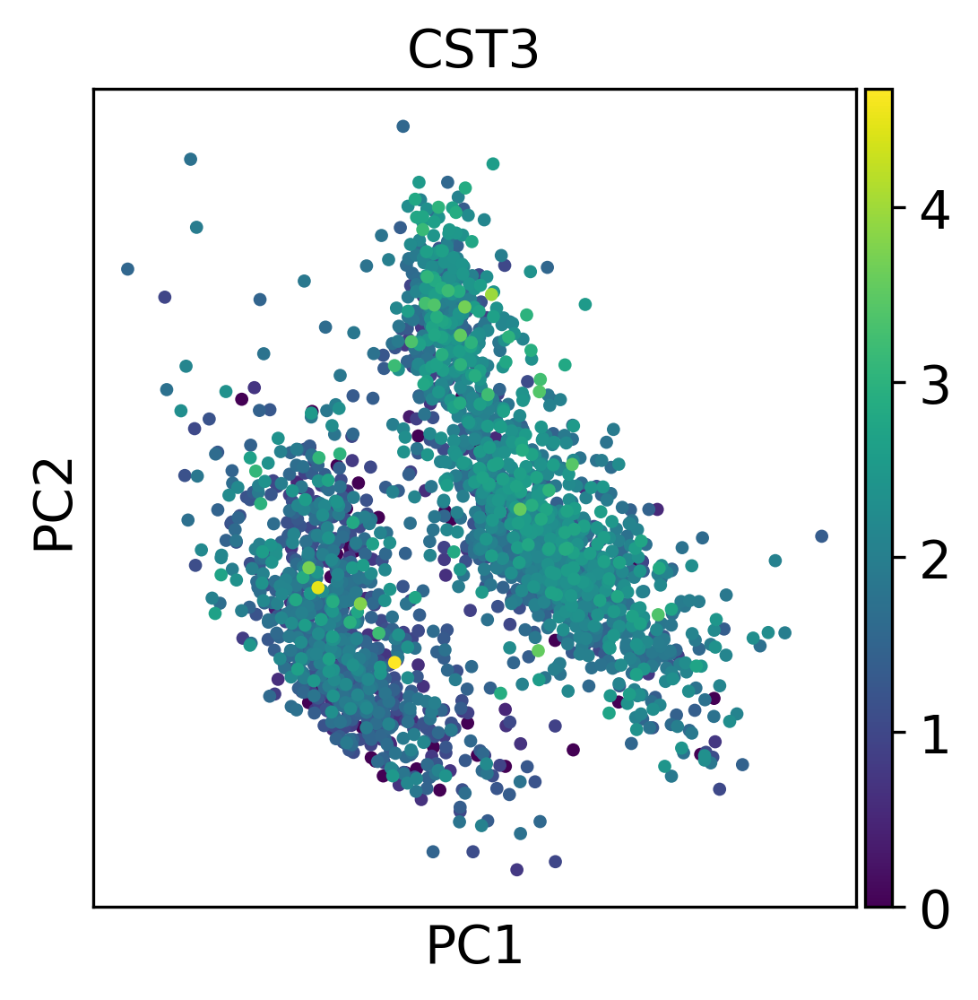

In [111]:
sc.pl.pca(adata, color='CST3')

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function  `sc.tl.louvain()` or tSNE `sc.tl.tsne()`. In our experience, often, a rough estimate of the number of PCs does fine. Seurat provides many more functions, here.

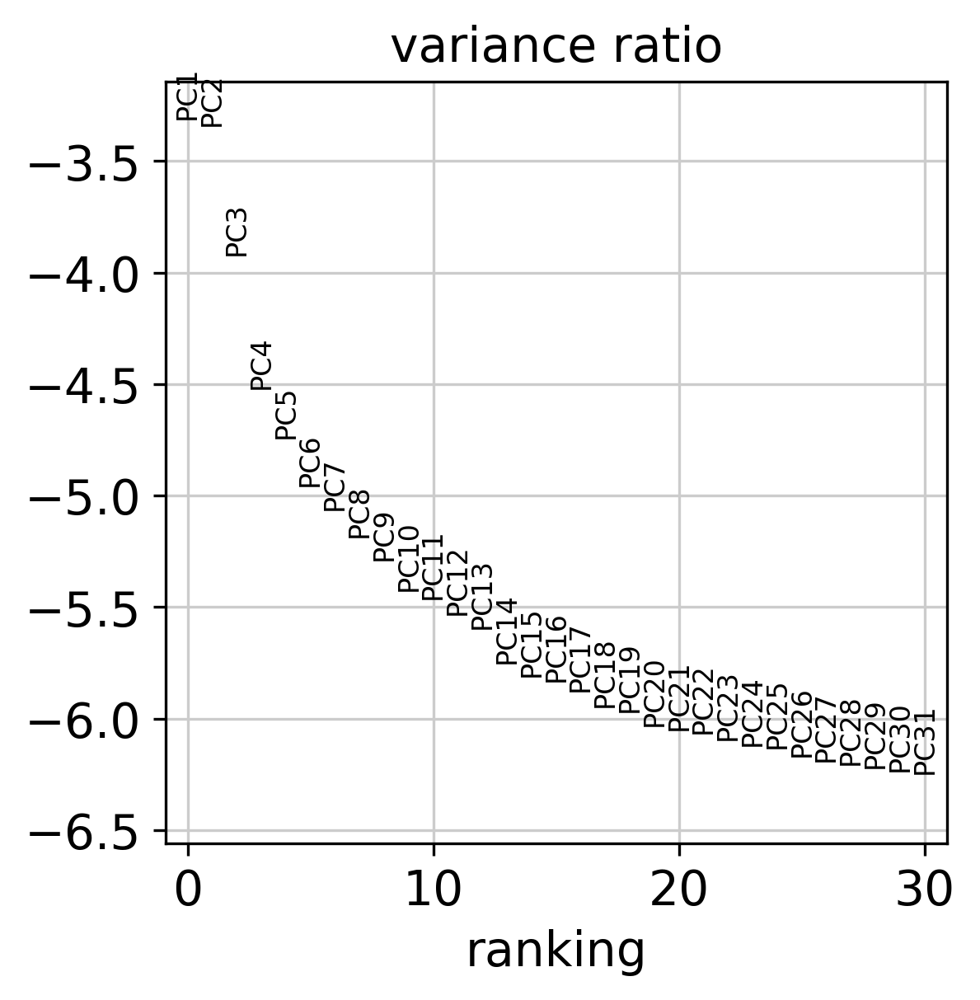

In [112]:
sc.pl.pca_variance_ratio(adata, log=True)

In [113]:
adata.write(results_file)

In [114]:
adata

AnnData object with n_obs × n_vars = 2413 × 2362 
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

## Computing the neighborhood graph

In [115]:
adata = sc.read(results_file)

Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. For the sake of reproducing Seurat's results, let's take the following values

In [116]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished (0:00:03.59) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix


We now advertise visualizing the data using UMAP, see below. In particular, if you have large data, this will give you a notable speedup. Also, it is potentially more faithful to global topology: trajectories are better preserved.

In [117]:
sc.tl.umap(adata)

computing UMAP
    finished (0:00:03.91) --> added
    'X_umap', UMAP coordinates (adata.obsm)


In [127]:
adata.var['highly_variable'].head(20)

index
HES4             True
ISG15            True
AGRN             True
TNFRSF18         True
ATAD3C           True
MMP23B           True
SLC35E2B         True
TNFRSF14         True
TTC34            True
LINC00982        True
SMIM1            True
GPR153           True
TNFRSF25         True
TAS1R1           True
PER3             True
UTS2             True
ERRFI1           True
ENO1             True
RP11-558F24.4    True
RBP7             True
Name: highly_variable, dtype: bool

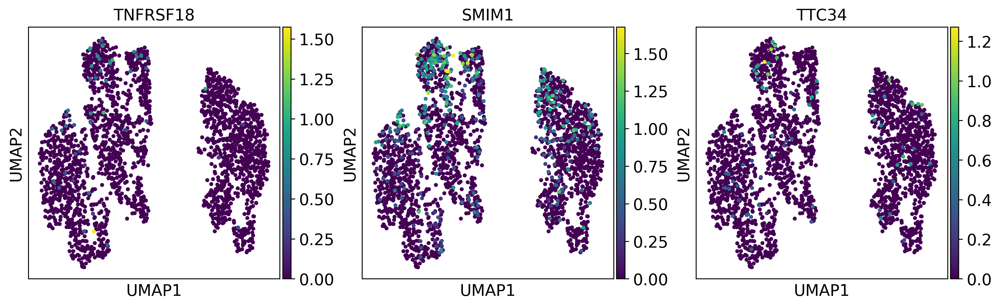

In [129]:
sc.pl.umap(adata, color=['TNFRSF18', 'SMIM1', 'TTC34'])

As we set the `.raw` attribute of AnnData (a "frozen" state of the object at a point in the pipeline where we deemed the data "raw"), the previous plots showed the "raw" (normalized, logarithmized, but uncorrected) gene expression. You can also plot the scaled and corrected gene expression by explicitly stating that you don't want to use `.raw`.

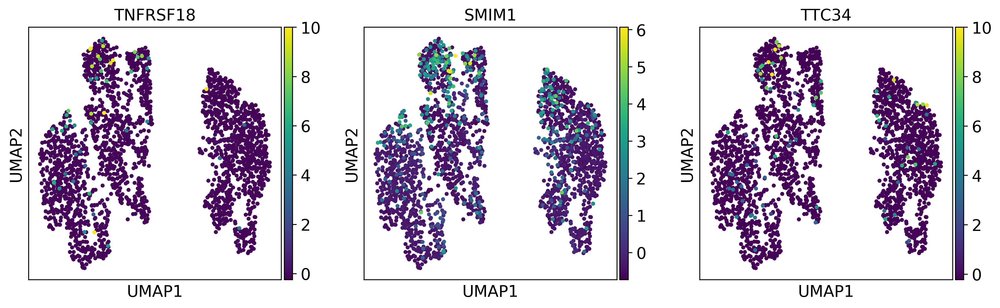

In [130]:
sc.pl.umap(adata, color=['TNFRSF18', 'SMIM1', 'TTC34'], use_raw=False)

## Clustering the graph

As Seurat and many others, we recommend the Louvain graph-clustering method (community detection based on optimizing modularity). It has been proposed for single-cell data by [Levine *et al.* (2015)](https://doi.org/10.1016/j.cell.2015.05.047). Note that Louvain clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section.

In [126]:
sc.tl.louvain(adata)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.16) --> found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


Plot the data with tSNE. Coloring according to clustering. Clusters agree quite well with the result of Seurat.

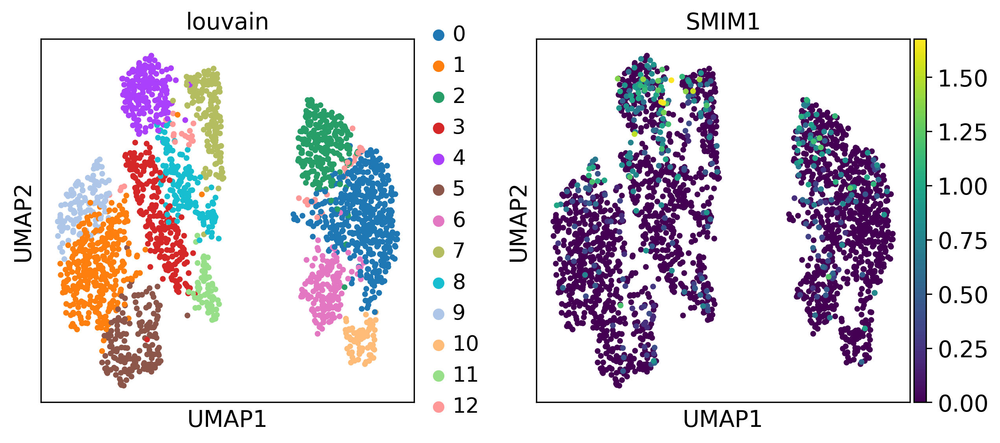

In [132]:
sc.pl.umap(adata, color=['louvain', 'SMIM1'])

In [133]:
adata.write(results_file)

## Finding marker genes

Let us compute a ranking for the highly differential genes in each cluster. For this, by default, the `.raw` attribute of AnnData is used in case it has been initialized before. The simplest and fastest method to do so is the t-test.

ranking genes
    finished (0:00:03.38)


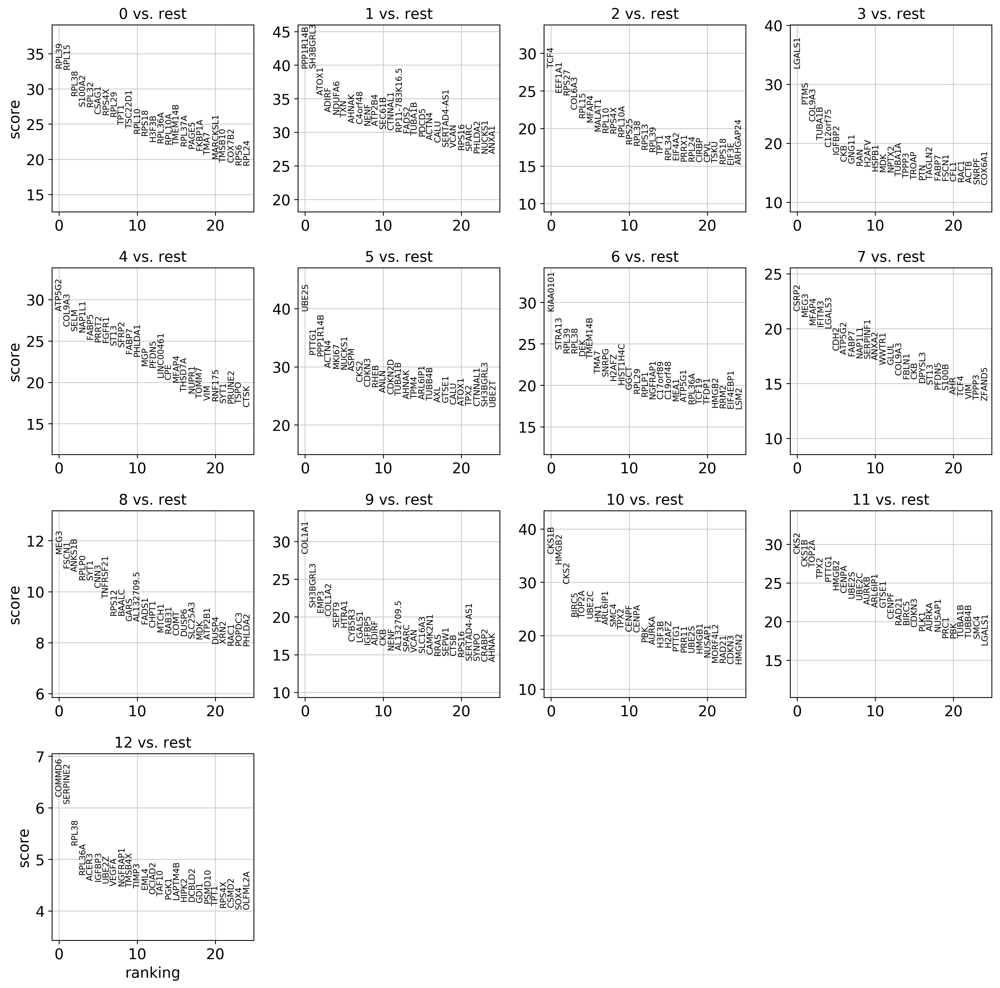

In [146]:
adata = sc.read(results_file)
sc.tl.rank_genes_groups(adata, 'louvain', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

ranking genes
    finished (0:00:08.23)


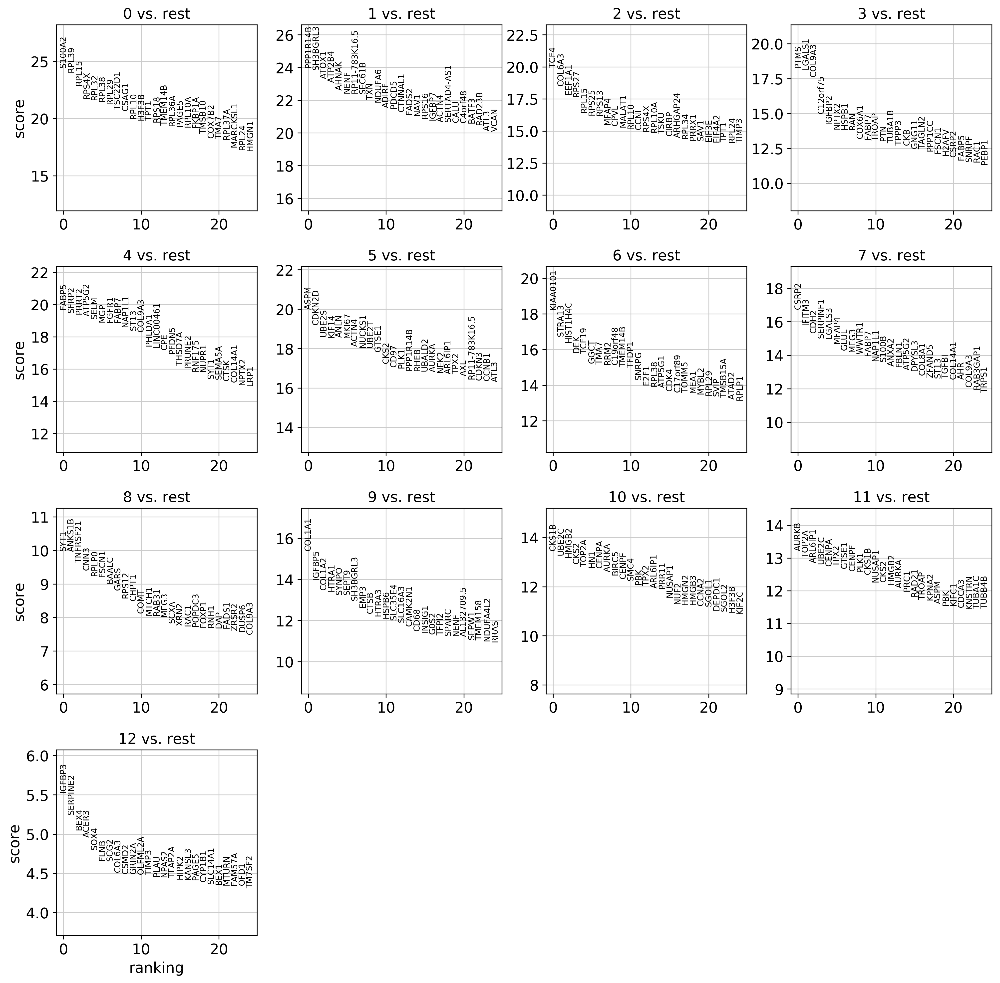

In [154]:
sc.tl.rank_genes_groups(adata, 'louvain', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [148]:
sc.settings.verbosity = 2  # reduce the verbosity

The result of a [Wilcoxon rank-sum (Mann-Whitney-U)](https://de.wikipedia.org/wiki/Wilcoxon-Mann-Whitney-Test) test is very similar.

ranking genes
    finished (0:00:22.48)


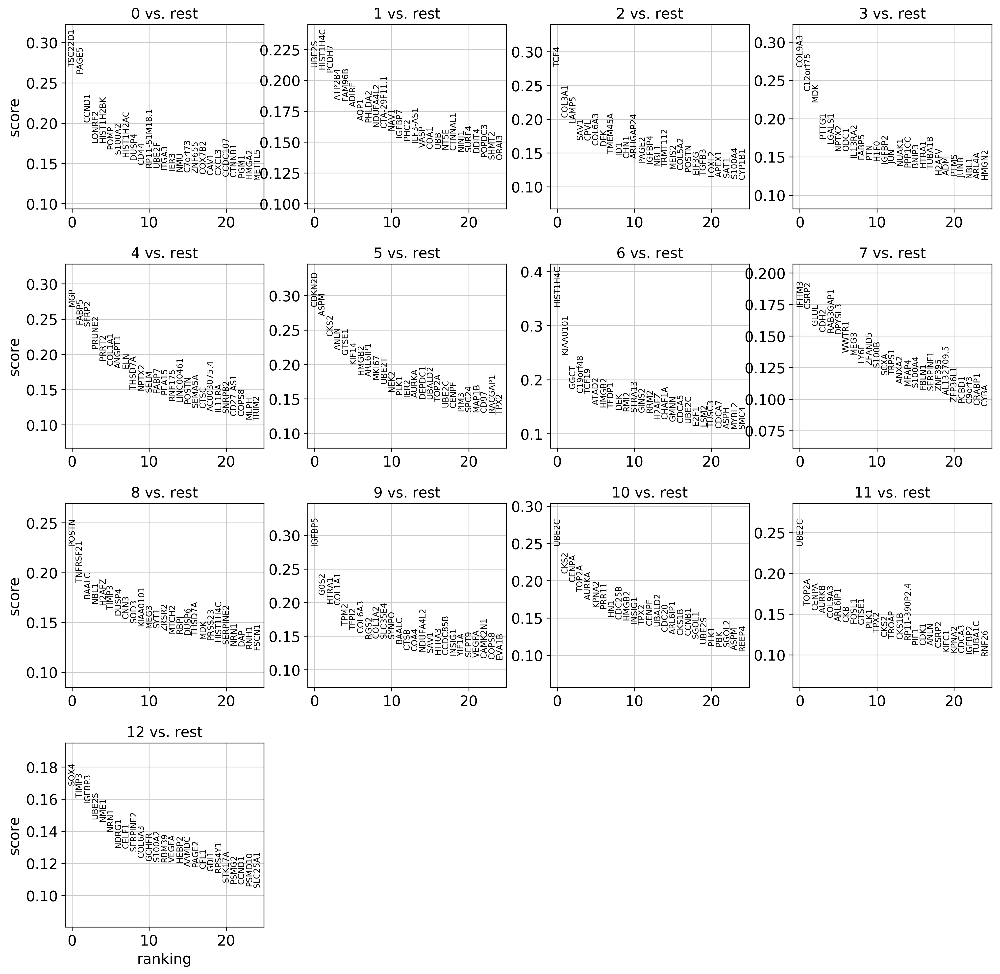

In [149]:
adata_copy = adata.copy()
sc.tl.rank_genes_groups(adata_copy, 'louvain', method='logreg')
sc.pl.rank_genes_groups(adata_copy, n_genes=25, sharey=False)

With the exceptions of *IL7R*, which is only found by the t-test and *FCER1A*, which is only found by the other two appraoches, all marker genes are recovered in all approaches.

Louvain Group | Markers | Cell Type
---|---|---
0 | IL7R | CD4 T cells
1 | CD14, LYZ | CD14+ Monocytes
2 | MS4A1 |	B cells
3 | CD8A |	CD8 T cells
4 | GNLY, NKG7 | 	NK cells
5 | FCGR3A, MS4A7 |	FCGR3A+ Monocytes
6 | FCER1A, CST3 |	Dendritic Cells
7 | PPBP |	Megakaryocytes

Let us also define a list of marker genes for later reference.

Show the 10 top ranked genes per cluster 0, 1, ..., 12 in a dataframe.

In [138]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,S100A2,PPP1R14B,TCF4,PTMS,FABP5,ASPM,KIAA0101,CSRP2,SYT1,COL1A1,CKS1B,AURKB,IGFBP3
1,RPL39,SH3BGRL3,COL6A3,LGALS1,SFRP2,CDKN2D,STRA13,IFITM3,ANKS1B,IGFBP5,UBE2C,TOP2A,SERPINE2
2,RPL15,ATOX1,EEF1A1,COL9A3,PRRT2,UBE2S,HIST1H4C,CDH2,TNFRSF21,COL1A2,HMGB2,ARL6IP1,BEX4
3,RPS4X,ATP2B4,RPS27,C12orf75,ATP5G2,KIF14,DEK,SERPINF1,CNN3,HTRA1,CKS2,UBE2C,ACER3
4,RPL32,AHNAK,RPL15,IGFBP2,SELM,ANLN,TCF19,LGALS3,RPLP0,SYNPO,TOP2A,CENPA,SOX4
5,RPL38,NENF,RPS25,NPTX2,MGP,MKI67,GGCT,MFAP4,FSCN1,SEPT9,HN1,TPX2,FLNB
6,RPL29,RP11-783K16.5,RPS13,HSPB1,FGFR1,ACTN4,TMA7,GLUL,BAALC,SH3BGRL3,CENPA,GTSE1,SCG2
7,TSC22D1,SEC61B,MFAP4,RAN,FABP7,NUCKS1,RRM2,MEG3,GARS,EMP3,AURKA,CENPF,COL6A3
8,CSAG1,TXN,CPVL,COX6A1,NAP1L1,UBE2T,C19orf48,WWTR1,RPS12,CTSB,BIRC5,PLK1,CSMD2
9,RPL10,NDUFA6,MALAT1,FABP7,ST13,GTSE1,TMEM14B,FABP7,CHPT1,HTRA3,CENPF,CKS1B,GRIN2A


Get a table with the scores and groups.

In [150]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,8_n,8_p,9_n,9_p,10_n,10_p,11_n,11_p,12_n,12_p
0,S100A2,5.678049e-132,PPP1R14B,3.460648e-127,TCF4,1.977525e-88,PTMS,1.228835e-74,FABP5,1.922350e-86,...,SYT1,1.805550e-23,COL1A1,2.091530e-53,CKS1B,2.923282e-41,AURKB,7.191643e-40,IGFBP3,3.236206e-08
1,RPL39,7.012780e-128,SH3BGRL3,7.305669e-126,COL6A3,1.837998e-76,LGALS1,1.019384e-73,SFRP2,1.151128e-84,...,ANKS1B,2.199684e-23,IGFBP5,1.328335e-44,UBE2C,3.056435e-40,TOP2A,1.086688e-38,SERPINE2,1.517734e-07
2,RPL15,6.213043e-116,ATOX1,2.578804e-120,EEF1A1,4.191817e-71,COL9A3,1.213610e-69,PRRT2,7.565996e-84,...,TNFRSF21,5.964867e-22,COL1A2,2.077199e-41,HMGB2,1.051526e-39,ARL6IP1,8.614892e-38,BEX4,4.384177e-07
3,RPS4X,1.119812e-104,ATP2B4,5.588130e-118,RPS27,6.952821e-70,C12orf75,1.015563e-50,ATP5G2,6.381047e-83,...,CNN3,5.206343e-21,HTRA1,4.598491e-41,CKS2,2.936205e-38,UBE2C,1.306538e-37,ACER3,6.998466e-07
4,RPL32,1.020063e-103,AHNAK,3.413659e-113,RPL15,1.192360e-60,IGFBP2,4.361764e-46,SELM,1.775986e-81,...,RPLP0,2.411393e-20,SYNPO,3.568116e-40,TOP2A,1.540356e-37,CENPA,2.989112e-37,SOX4,1.587853e-06


Compare to a single cluster.

ranking genes
    finished (0:00:01.29)


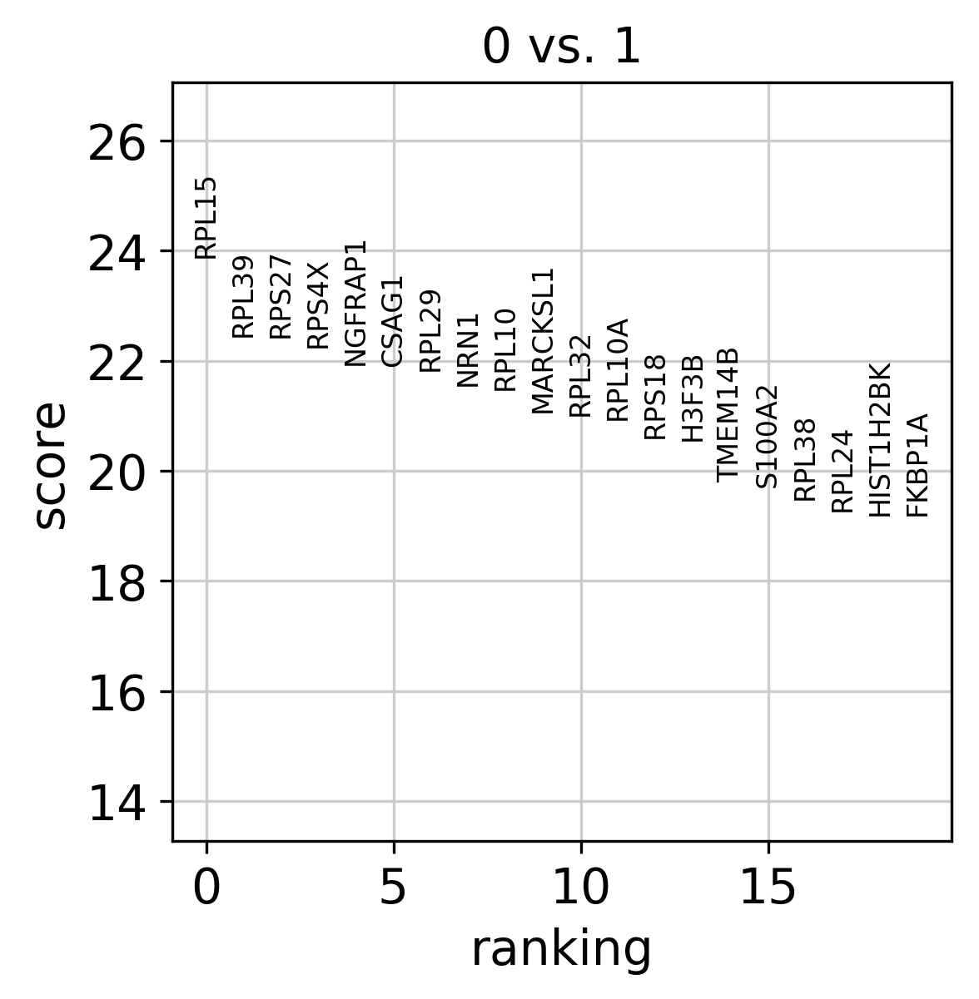

In [151]:
adata = sc.read(results_file)
sc.tl.rank_genes_groups(adata, 'louvain', groups=['0'], reference='1', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['0'], n_genes=20)

If we want a more detailed view for a certain group, use `sc.pl.rank_genes_groups_violin`.

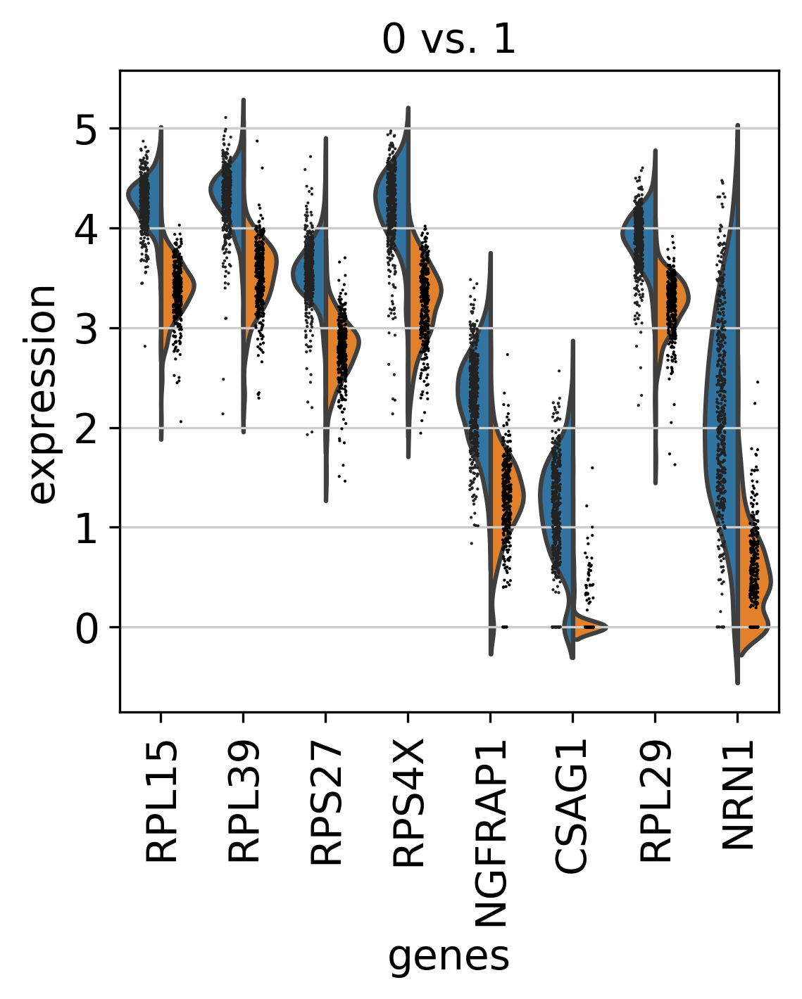

In [152]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)

Reread the examples that were computed by comparing to the rest of the groups.

ranking genes
    finished (0:00:07.92)


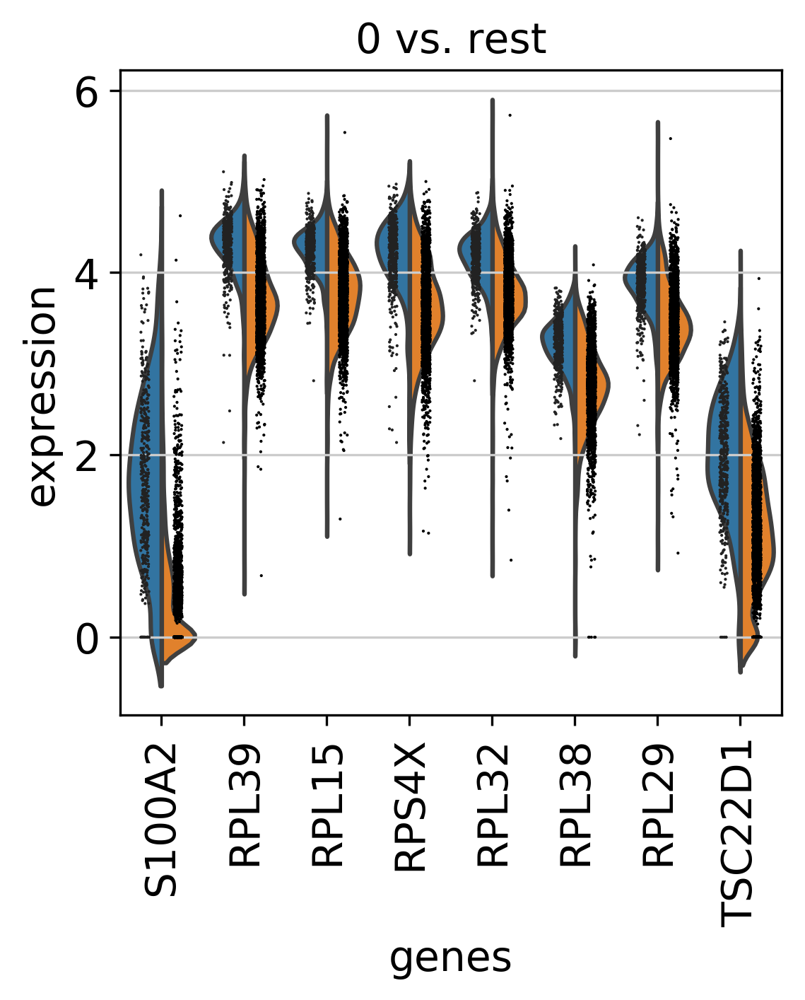

In [155]:
adata = sc.read(results_file)
sc.tl.rank_genes_groups(adata, 'louvain', method='wilcoxon')
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)

If you want to compare a certain gene across groups, use the following.

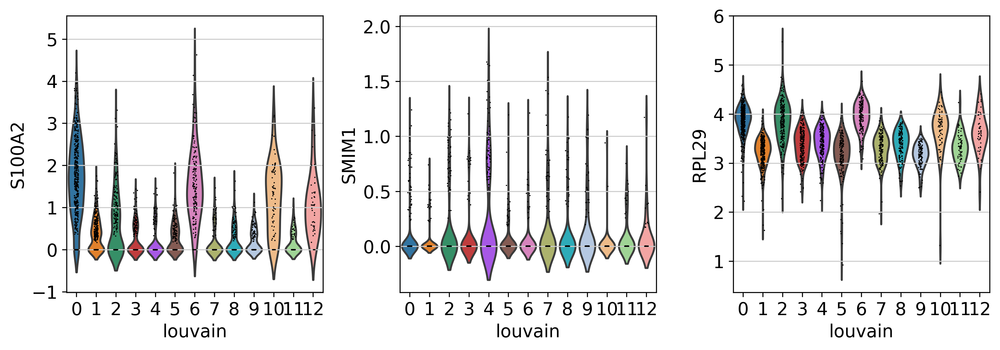

In [157]:
sc.pl.violin(adata, ['S100A2', 'SMIM1', 'RPL29'], groupby='louvain')

Actually mark the cell types.

In [161]:
new_cluster_names = [
    'CD4 T', 'CD14+ Monocytes',
    'B', 'CD8 T', 
    'NK', 'FCGR3A+ Monocytes',
    'Dendritic', 'Megakaryocytes1',
    'Megakaryocytes2','Megakaryocytes3','Megakaryocytes4','Megakaryocytes5','Megakaryocytes6'
]
adata.rename_categories('louvain', new_cluster_names)

saving figure to file ./figures/umap.pdf


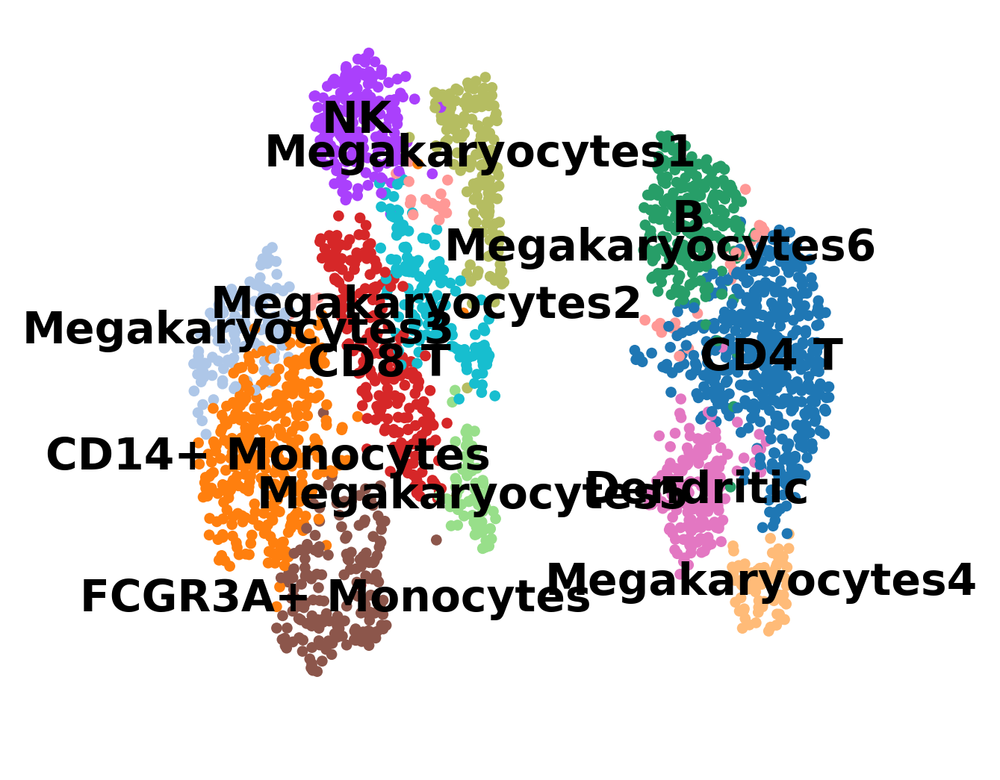

In [162]:
sc.pl.umap(adata, color='louvain', legend_loc='on data', title='', frameon=False, save='.pdf')

Now that we annotated the cell types, let us visualize the marker genes.

In [164]:
marker_genes = ["S100A2","PPP1R14B","TCF4", "PTMS", "FABP5", "ASPM", "KIAA0101", "CSRP2", "SYT1", "COL1A1", "CKS1B", "AURKB", "IGFBP3"]

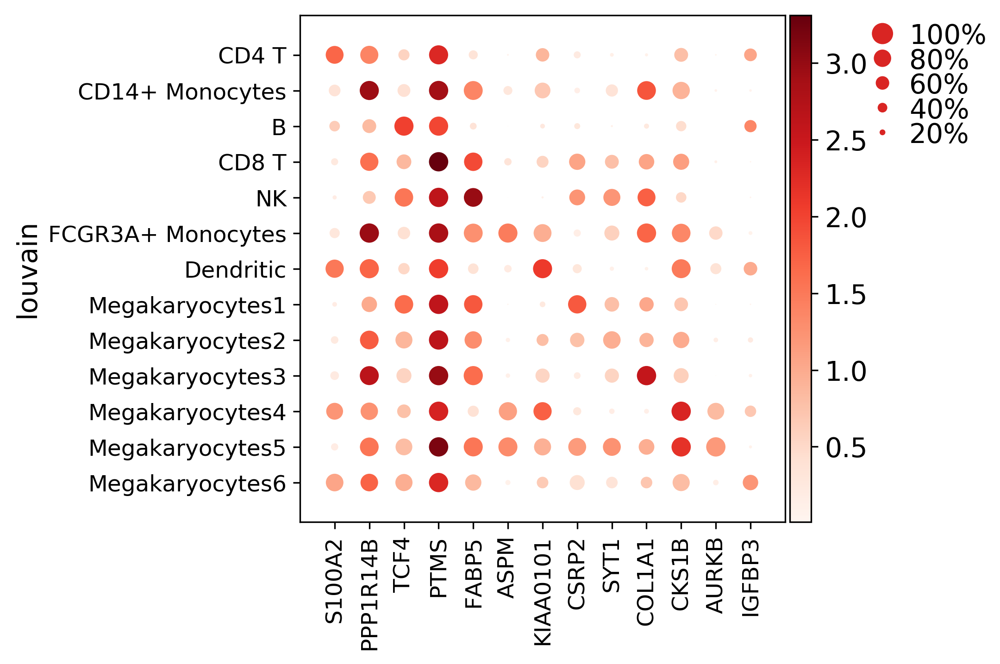

In [165]:
gs = sc.pl.dotplot(adata, marker_genes, groupby='louvain')

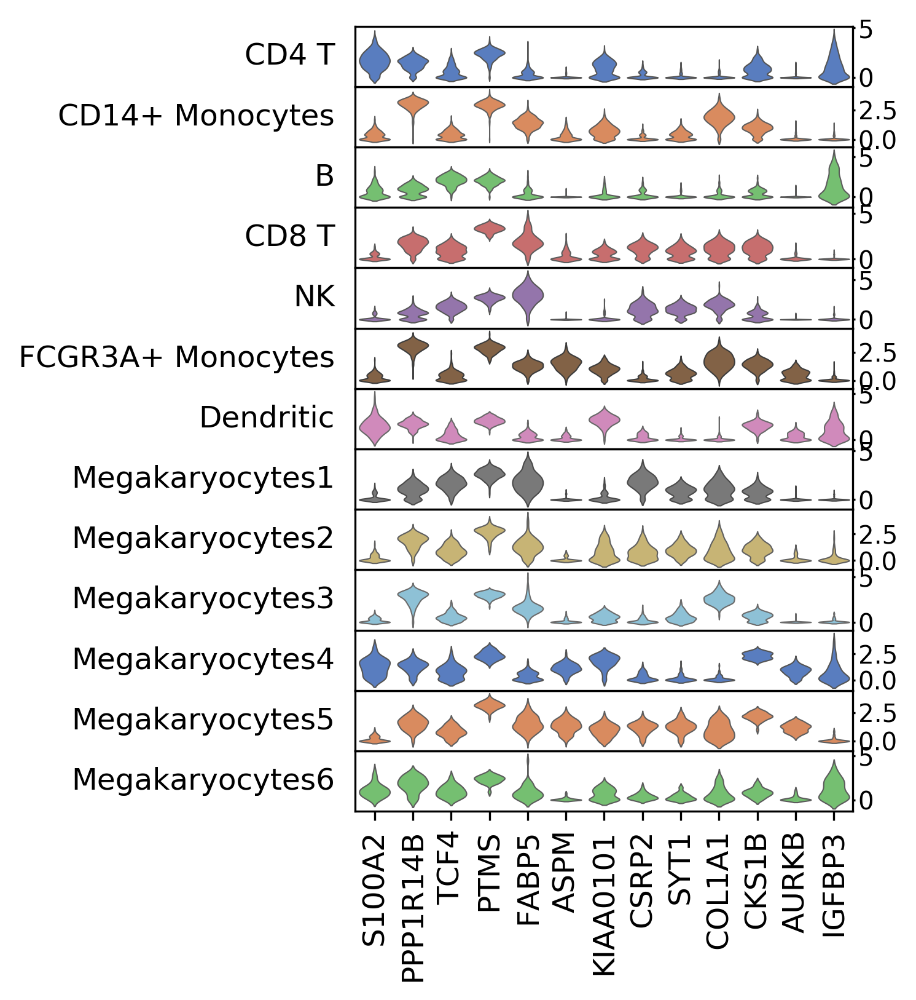

In [166]:
axs = sc.pl.stacked_violin(adata, marker_genes, groupby='louvain', rotation=90)

See more examples using heatmaps and annotions of the plots [here](https://gist.github.com/fidelram/2289b7a8d6da055fb058ac9a79ed485c).

During the course of this analysis, the AnnData accumlated the following annotations.

In [168]:
adata

AnnData object with n_obs × n_vars = 2413 × 2362 
    obs: 'n_genes', 'percent_mito', 'n_counts', 'louvain'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [169]:
adata.write(results_file)

Get a rough overview of the file using `h5ls`, which has many options - for more details see [here](https://github.com/theislab/scanpy_usage/blob/master/170505_seurat/info_h5ad.md). The file format might still be subject to further optimization in the future. All reading functions will remain backwards-compatible, though.

If you want to share this file with people who merely want to use it for visualization, a simple way to reduce the file size is by removing the dense scaled and corrected data matrix. The file still contains the raw data used in the visualizations.

In [170]:
adata.X = None
adata.write('./write/pbmc3k_withoutX.h5ad')

If you want to export to "csv", you have the following options:

In [172]:
# Export single fields of the annotation of observations
# adata.obs[['n_counts', 'louvain_groups']].to_csv(
#     './write/pbmc3k_corrected_louvain_groups.csv')

# Export single columns of the multidimensional annotation
# adata.obsm.to_df()[['X_pca1', 'X_pca2']].to_csv(
#     './write/pbmc3k_corrected_X_pca.csv')

# Or export everything except the data using `.write_csvs`.
# Set `skip_data=False` if you also want to export the data.
# adata.write_csvs(results_file[:-5], )